<a href="https://colab.research.google.com/github/Davron030901/PyTorch/blob/main/33_Keras_Super_Resolution_SRGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Super-Resolution using an Efficient Sub-Pixel CNN (SRGAN)**

---


In this lesson, we will implement **Image Super-Resolution using an Efficient Sub-Pixel CNN** using Tensorflow and Keras.

1. Setup & load and prepare the dataset
2. Preprocess our images (Colorspace, Crop and resize images)
3. Build the Model
4. Train the Model
5. Display model prediction and plot the result

**Tutorial Inspiration and Credit:**

https://keras.io/examples/vision/super_resolution_sub_pixel/

**Author:** [Xingyu Long](https://github.com/xingyu-long)<br>
**Date created:** 2020/07/28<br>
**Last modified:** 2020/08/27<br>
**Description:** Implementing Super-Resolution using Efficient sub-pixel model on BSDS500.

## **Introduction**

ESPCN (Efficient Sub-Pixel CNN), proposed by [Shi, 2016](https://arxiv.org/abs/1609.05158)
is a model that reconstructs a high-resolution version of an image given a low-resolution version.
It leverages efficient "sub-pixel convolution" layers, which learns an array of
image upscaling filters.

In this tutorial example, we will implement the model from the paper and train it on a small dataset,
[BSDS500](https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/resources.html) - a dataset of natural images.

## **1. Setup & load and prepare the dataset**

In [ ]:
import tensorflow as tf

import os
import math
import numpy as np

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import array_to_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing import image_dataset_from_directory

from IPython.display import display

### **Load data: BSDS500 dataset**

#### **Download dataset**

We use the built-in `keras.utils.get_file` utility to retrieve the dataset.

In [ ]:
# gdown kutubxonasini o'rnatish (agar mavjud bo'lmasa)
!pip install gdown -q

# Google Drive file ID sini olish (URL dan)
# URL: https://drive.google.com/file/d/1aaa9ZMYCLZumjdI1U7V9-0Welma9A0WQ/view?usp=sharing
# ID: 1aaa9ZMYCLZumjdI1U7V9-0Welma9A0WQ

import gdown
import os

# Drive file ID
file_id = "1aaa9ZMYCLZumjdI1U7V9-0Welma9A0WQ"

# Yuklash yo'li
output_path = "BSDS500.tar"

# Faylni yuklab olish
gdown.download(f"https://drive.google.com/uc?id={file_id}", output_path, quiet=False)

# Agar fayl arxiv bo'lsa, uni ochish
!tar -xf {output_path}

Downloading...
From: https://drive.google.com/uc?id=1aaa9ZMYCLZumjdI1U7V9-0Welma9A0WQ
To: /content/BSDS500.tar
100%|██████████| 70.8M/70.8M [00:01<00:00, 36.8MB/s]


Ma'lumotlar yuklab olindi va ./BSDS500/data joyiga joylashtirildi.


#### **Split our dataset into training and validation datasets**

We create training and validation datasets via `image_dataset_from_directory`.

In [ ]:
crop_size = 300
upscale_factor = 3
input_size = crop_size // upscale_factor
batch_size = 8
root_dir_tr = "/content/BSR/BSDS500/data/images/train"
root_dir_val = "/content/BSR/BSDS500/data/images/train"

# print(f"Tanlangan katalog: {root_dir}")
# print(f"Katalogdagi fayl turlari:")
# !find {root_dir} -type f | grep -E "\.jpg$|\.png$|\.jpeg$" | wc -l

# Endi dataset yaratish
train_ds = image_dataset_from_directory(
    root_dir_tr,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="training",
    seed=1337,
    label_mode=None,
)

valid_ds = image_dataset_from_directory(
    root_dir_val,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="validation",
    seed=1337,
    label_mode=None,
)

Found 200 files.
Using 160 files for training.
Found 200 files.
Using 40 files for validation.


#### **Normalize/rescale our data between 0 and 1**


In [ ]:
def scaling(input_image):
    input_image = input_image / 255.0
    return input_image


# Scale from (0, 255) to (0, 1)
train_ds = train_ds.map(scaling)
valid_ds = valid_ds.map(scaling)

#### **Visualise some examples**

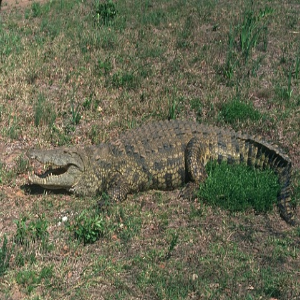

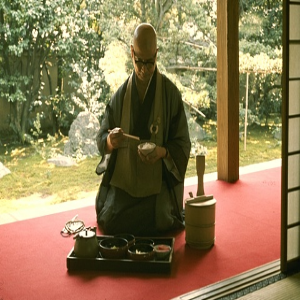

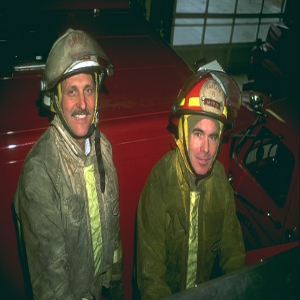

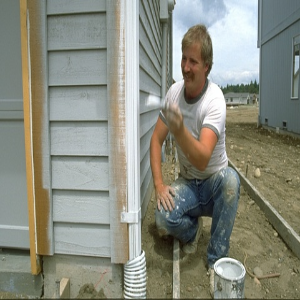

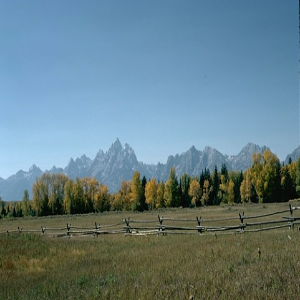

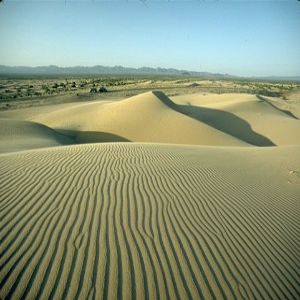

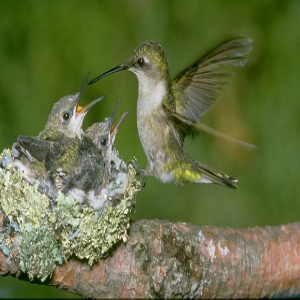

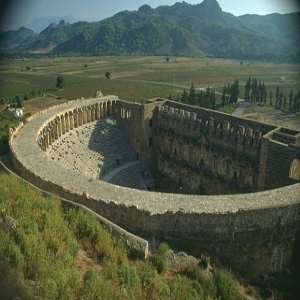

In [ ]:
for batch in train_ds.take(1):
    for img in batch:
        display(array_to_img(img))

We prepare a dataset of test image paths that we will use for
visual evaluation at the end of this example.

In [ ]:
root_dir = "/content/BSR/BSDS500/data/"

dataset = os.path.join(root_dir, "images")
test_path = os.path.join(dataset, "test")

test_img_paths = sorted(
    [
        os.path.join(test_path, fname)
        for fname in os.listdir(test_path)
        if fname.endswith(".jpg")
    ]
)

## **2. Preprocess our images (Colorspace, Crop and resize images)**

Let's process image data.
First, we convert our images from the RGB color space to the
[YUV colour space](https://en.wikipedia.org/wiki/YUV).

![](https://upload.wikimedia.org/wikipedia/commons/thumb/f/f9/YUV_UV_plane.svg/600px-YUV_UV_plane.svg.png)

Image Source: https://en.wikipedia.org/wiki/YUV

It encodes a color image or video taking human perception into account, allowing reduced bandwidth for chrominance components, thereby typically enabling transmission errors or compression artifacts to be more efficiently masked by the human perception than using a "direct" RGB-representation.

For the input data (low-resolution images),
we crop the image, retrieve the `y` channel (luninance),
and resize it with the `area` method (use `BICUBIC` if you use PIL).
We only consider the luminance channel
in the YUV color space because humans are more sensitive to
luminance change.

For the target data (high-resolution images), we just crop the image
and retrieve the `y` channel.

To learn about the prefetching go to the TensorFlow official documentation - https://www.tensorflow.org/guide/data_performance

In [ ]:
# Use TF Ops to process.
def process_input(input, input_size, upscale_factor):
    input = tf.image.rgb_to_yuv(input)
    last_dimension_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis=last_dimension_axis)
    return tf.image.resize(y, [input_size, input_size], method="area")


def process_target(input):
    input = tf.image.rgb_to_yuv(input)
    last_dimension_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis=last_dimension_axis)
    return y


train_ds = train_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
train_ds = train_ds.prefetch(buffer_size=32)

valid_ds = valid_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
valid_ds = valid_ds.prefetch(buffer_size=32)

#### **View the training and Target Data**
Let's take a look at the input and target data.

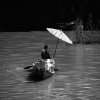

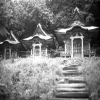

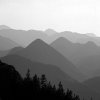

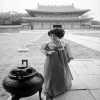

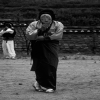

...

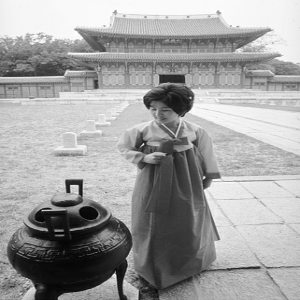

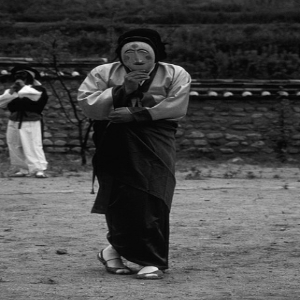

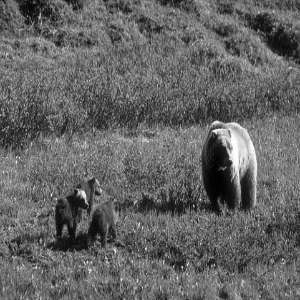

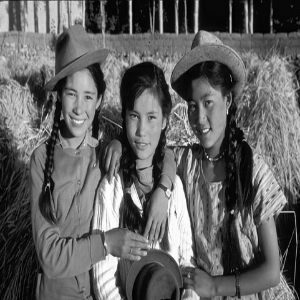

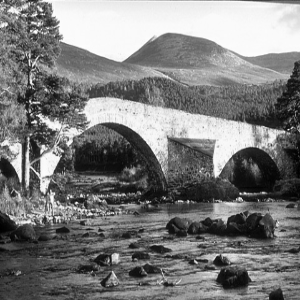

In [ ]:
for batch in train_ds.take(1):
    for img in batch[0]:
        display(array_to_img(img))
    for img in batch[1]:
        display(array_to_img(img))

## **3. Build the model**

Compared to the paper, we add one more layer and we use the `relu` activation function
instead of `tanh`.
It achieves better performance even though we train the model for fewer epochs.

In [ ]:
class DepthToSpace(layers.Layer):
    def __init__(self, upscale_factor, **kwargs):
        super().__init__(**kwargs)
        self.upscale_factor = upscale_factor

    def call(self, inputs):
        return tf.nn.depth_to_space(inputs, self.upscale_factor)

def get_model(upscale_factor=3, channels=1):
    conv_args = {
        "activation": "relu",
        "kernel_initializer": "Orthogonal",
        "padding": "same",
    }
    inputs = keras.Input(shape=(None, None, channels))

    x = layers.Conv2D(64, 5, **conv_args)(inputs)
    x = layers.Conv2D(64, 3, **conv_args)(x)
    x = layers.Conv2D(32, 3, **conv_args)(x)
    x = layers.Conv2D(channels * (upscale_factor ** 2), 3, **conv_args)(x)
    outputs = DepthToSpace(upscale_factor)(x)  # Custom qatlam orqali ishlatish

    return keras.Model(inputs, outputs)

### **Define utility functions**

We need to define several utility functions to monitor our results:

- `plot_results` to plot an save an image.
- `get_lowres_image` to convert an image to its low-resolution version.
- `upscale_image` to turn a low-resolution image to
a high-resolution version reconstructed by the model.
In this function, we use the `y` channel from the YUV color space
as input to the model and then combine the output with the
other channels to obtain an RGB image.

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import PIL


def plot_results(img, prefix, title):
    """Plot the result with zoom-in area."""
    img_array = img_to_array(img)
    img_array = img_array.astype("float32") / 255.0

    # Create a new figure with a default 111 subplot.
    fig, ax = plt.subplots()
    im = ax.imshow(img_array[::-1], origin="lower")

    plt.title(title)
    # zoom-factor: 2.0, location: upper-left
    axins = zoomed_inset_axes(ax, 2, loc=2)
    axins.imshow(img_array[::-1], origin="lower")

    # Specify the limits.
    x1, x2, y1, y2 = 200, 300, 100, 200
    # Apply the x-limits.
    axins.set_xlim(x1, x2)
    # Apply the y-limits.
    axins.set_ylim(y1, y2)

    plt.yticks(visible=False)
    plt.xticks(visible=False)

    # Make the line.
    mark_inset(ax, axins, loc1=1, loc2=3, fc="none", ec="blue")
    plt.savefig(str(prefix) + "-" + title + ".png")
    plt.show()


def get_lowres_image(img, upscale_factor):
    """Return low-resolution image to use as model input."""
    return img.resize(
        (img.size[0] // upscale_factor, img.size[1] // upscale_factor),
        PIL.Image.BICUBIC,
    )


def upscale_image(model, img):
    """Predict the result based on input image and restore the image as RGB."""
    ycbcr = img.convert("YCbCr")
    y, cb, cr = ycbcr.split()
    y = img_to_array(y)
    y = y.astype("float32") / 255.0

    input = np.expand_dims(y, axis=0)
    out = model.predict(input)

    out_img_y = out[0]
    out_img_y *= 255.0

    # Restore the image in RGB color space.
    out_img_y = out_img_y.clip(0, 255)
    out_img_y = out_img_y.reshape((np.shape(out_img_y)[0], np.shape(out_img_y)[1]))
    out_img_y = PIL.Image.fromarray(np.uint8(out_img_y), mode="L")
    out_img_cb = cb.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img_cr = cr.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img = PIL.Image.merge("YCbCr", (out_img_y, out_img_cb, out_img_cr)).convert(
        "RGB"
    )
    return out_img


### **Define callbacks to monitor training**
The `ESPCNCallback` (Efficient Sub-Pixel CNN) object will compute and display
the [Peak Signal to Noise Ration (PSNR)](https://en.wikipedia.org/wiki/Peak_signal-to-noise_ratio) metric.
This is the main metric we use to evaluate super-resolution performance.

In [ ]:
class ESPCNCallback(keras.callbacks.Callback):
    def __init__(self):
        super(ESPCNCallback, self).__init__()
        self.test_img = get_lowres_image(load_img(test_img_paths[0]), upscale_factor)

    # Store PSNR value in each epoch.
    def on_epoch_begin(self, epoch, logs=None):
        self.psnr = []

    def on_epoch_end(self, epoch, logs=None):
        print("Mean PSNR for epoch: %.2f" % (np.mean(self.psnr)))
        if epoch % 20 == 0:
            prediction = upscale_image(self.model, self.test_img)
            plot_results(prediction, "epoch-" + str(epoch), "prediction")

    def on_test_batch_end(self, batch, logs=None):
        self.psnr.append(10 * math.log10(1 / logs["loss"]))


#### **Define `ModelCheckpoint` and `EarlyStopping` callbacks.**

In [ ]:
early_stopping_callback = keras.callbacks.EarlyStopping(monitor="loss", patience=10)

checkpoint_filepath = "/tmp/checkpoint.weights.h5"

model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor="loss",
    mode="min",
    save_best_only=True,
)

model = get_model(upscale_factor=upscale_factor, channels=1)
model.summary()

callbacks = [ESPCNCallback(), early_stopping_callback, model_checkpoint_callback]
loss_fn = keras.losses.MeanSquaredError()
optimizer = keras.optimizers.Adam(learning_rate=0.001)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, None, None, 1)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, None, None, 64) │         1,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, None, None, 64) │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, None, None, 32) │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, None, None, 9)  │         2,601 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ depth_to_space (DepthToSpace)   │ (None, None, None, 1)  │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 59,657 (233.04 KB)

 Trainable params: 59,657 (233.04 KB)

 Non-trainable params: 0 (0.00 B)

## **4. Train the model**

Now we're ready to train.

Epoch 1/100
Mean PSNR for epoch: 17.26
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 633ms/step


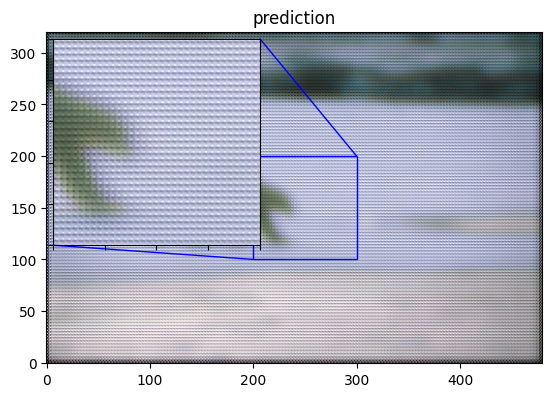

20/20 - 8s - 405ms/step - loss: 0.0720 - val_loss: 0.0184
Epoch 2/100
Mean PSNR for epoch: 20.68
20/20 - 1s - 35ms/step - loss: 0.0113 - val_loss: 0.0087
Epoch 3/100
Mean PSNR for epoch: 22.64
20/20 - 1s - 63ms/step - loss: 0.0065 - val_loss: 0.0059
Epoch 4/100
Mean PSNR for epoch: 22.62
20/20 - 1s - 62ms/step - loss: 0.0047 - val_loss: 0.0047
Epoch 5/100
Mean PSNR for epoch: 23.83
20/20 - 1s - 64ms/step - loss: 0.0039 - val_loss: 0.0040
Epoch 6/100
Mean PSNR for epoch: 24.27
20/20 - 1s - 35ms/step - loss: 0.0035 - val_loss: 0.0036
Epoch 7/100
Mean PSNR for epoch: 25.07
20/20 - 2s - 80ms/step - loss: 0.0032 - val_loss: 0.0033
Epoch 8/100
Mean PSNR for epoch: 23.44
20/20 - 1s - 59ms/step - loss: 0.0033 - val_loss: 0.0040
Epoch 9/100
Mean PSNR for epoch: 25.00
20/20 - 1s - 46ms/step - loss: 0.0031 - val_loss: 0.0033
Epoch 10/100
Mean PSNR for epoch: 25.32
20/20 - 1s - 35ms/step - loss: 0.0029 - val_loss: 0.0031
Epoch 11/100
Mean PSNR for epoch: 25.04
20/20 - 1s - 34ms/step - loss: 0.0028

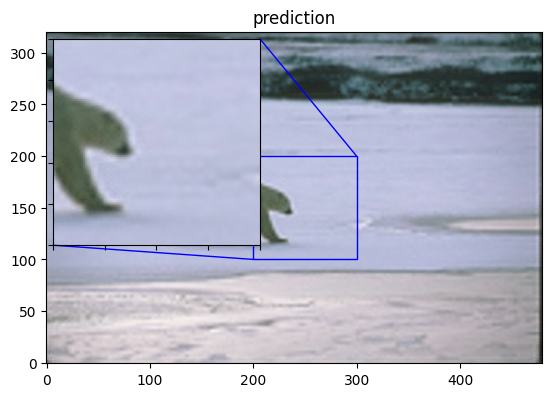

20/20 - 1s - 55ms/step - loss: 0.0026 - val_loss: 0.0028
Epoch 22/100
Mean PSNR for epoch: 25.67
20/20 - 1s - 33ms/step - loss: 0.0027 - val_loss: 0.0029
Epoch 23/100
Mean PSNR for epoch: 25.90
20/20 - 1s - 48ms/step - loss: 0.0027 - val_loss: 0.0031
Epoch 24/100
Mean PSNR for epoch: 25.38
20/20 - 1s - 66ms/step - loss: 0.0027 - val_loss: 0.0028
Epoch 25/100
Mean PSNR for epoch: 25.39
20/20 - 1s - 45ms/step - loss: 0.0026 - val_loss: 0.0027
Epoch 26/100
Mean PSNR for epoch: 25.85
20/20 - 1s - 35ms/step - loss: 0.0026 - val_loss: 0.0028
Epoch 27/100
Mean PSNR for epoch: 25.69
20/20 - 1s - 35ms/step - loss: 0.0026 - val_loss: 0.0027
Epoch 28/100
Mean PSNR for epoch: 25.22
20/20 - 1s - 62ms/step - loss: 0.0026 - val_loss: 0.0027
Epoch 29/100
Mean PSNR for epoch: 26.46
20/20 - 1s - 63ms/step - loss: 0.0026 - val_loss: 0.0027
Epoch 30/100
Mean PSNR for epoch: 25.62
20/20 - 1s - 33ms/step - loss: 0.0026 - val_loss: 0.0027
Epoch 31/100
Mean PSNR for epoch: 25.71
20/20 - 1s - 32ms/step - loss:

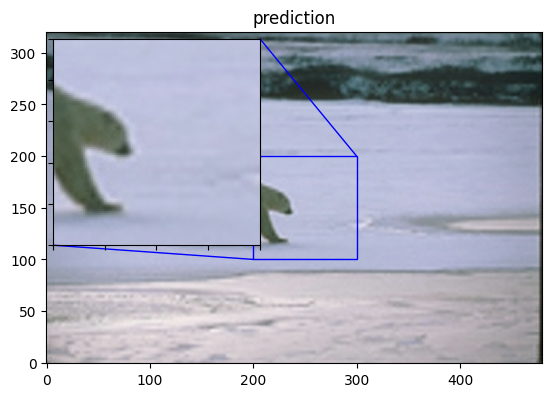

20/20 - 1s - 55ms/step - loss: 0.0025 - val_loss: 0.0028
Epoch 42/100
Mean PSNR for epoch: 26.02
20/20 - 1s - 33ms/step - loss: 0.0027 - val_loss: 0.0028
Epoch 43/100
Mean PSNR for epoch: 25.09
20/20 - 1s - 31ms/step - loss: 0.0028 - val_loss: 0.0030
Epoch 44/100
Mean PSNR for epoch: 26.63
20/20 - 1s - 42ms/step - loss: 0.0028 - val_loss: 0.0027
Epoch 45/100
Mean PSNR for epoch: 26.27
20/20 - 2s - 81ms/step - loss: 0.0025 - val_loss: 0.0027
Epoch 46/100
Mean PSNR for epoch: 25.90
20/20 - 1s - 35ms/step - loss: 0.0025 - val_loss: 0.0027
Epoch 47/100
Mean PSNR for epoch: 26.46
20/20 - 1s - 32ms/step - loss: 0.0025 - val_loss: 0.0027
Epoch 48/100
Mean PSNR for epoch: 25.66
20/20 - 1s - 33ms/step - loss: 0.0025 - val_loss: 0.0027
Epoch 49/100
Mean PSNR for epoch: 25.97
20/20 - 2s - 82ms/step - loss: 0.0025 - val_loss: 0.0027
Epoch 50/100
Mean PSNR for epoch: 26.29
20/20 - 1s - 69ms/step - loss: 0.0025 - val_loss: 0.0027
Epoch 51/100
Mean PSNR for epoch: 26.04
20/20 - 1s - 39ms/step - loss:

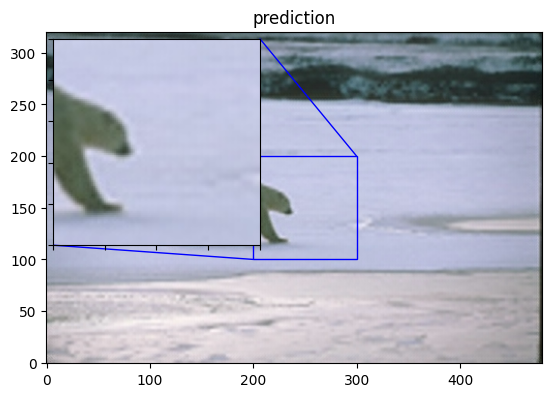

20/20 - 1s - 70ms/step - loss: 0.0025 - val_loss: 0.0027
Epoch 62/100
Mean PSNR for epoch: 26.37
20/20 - 2s - 101ms/step - loss: 0.0025 - val_loss: 0.0026
Epoch 63/100
Mean PSNR for epoch: 25.07
20/20 - 1s - 35ms/step - loss: 0.0024 - val_loss: 0.0026
Epoch 64/100
Mean PSNR for epoch: 26.62
20/20 - 1s - 34ms/step - loss: 0.0024 - val_loss: 0.0026
Epoch 65/100
Mean PSNR for epoch: 25.99
20/20 - 1s - 32ms/step - loss: 0.0024 - val_loss: 0.0026
Epoch 66/100
Mean PSNR for epoch: 25.90
20/20 - 1s - 66ms/step - loss: 0.0024 - val_loss: 0.0026
Epoch 67/100
Mean PSNR for epoch: 25.83
20/20 - 1s - 32ms/step - loss: 0.0025 - val_loss: 0.0027
Epoch 68/100
Mean PSNR for epoch: 25.02
20/20 - 1s - 62ms/step - loss: 0.0026 - val_loss: 0.0029
Epoch 69/100
Mean PSNR for epoch: 26.40
20/20 - 1s - 33ms/step - loss: 0.0026 - val_loss: 0.0027
Epoch 70/100
Mean PSNR for epoch: 27.36
20/20 - 1s - 33ms/step - loss: 0.0025 - val_loss: 0.0027
Epoch 71/100
Mean PSNR for epoch: 25.16
20/20 - 1s - 63ms/step - loss

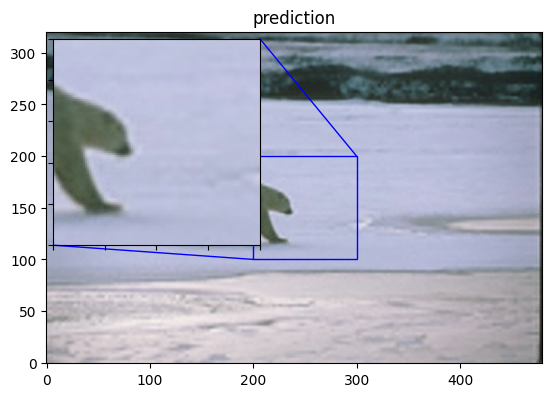

20/20 - 1s - 66ms/step - loss: 0.0027 - val_loss: 0.0027
Epoch 82/100
Mean PSNR for epoch: 25.50
20/20 - 1s - 34ms/step - loss: 0.0025 - val_loss: 0.0027
Epoch 83/100
Mean PSNR for epoch: 26.03
20/20 - 1s - 61ms/step - loss: 0.0025 - val_loss: 0.0027
Epoch 84/100
Mean PSNR for epoch: 25.96
20/20 - 1s - 64ms/step - loss: 0.0024 - val_loss: 0.0026
Epoch 85/100
Mean PSNR for epoch: 25.53
20/20 - 1s - 72ms/step - loss: 0.0024 - val_loss: 0.0026
Epoch 86/100
Mean PSNR for epoch: 25.99
20/20 - 2s - 81ms/step - loss: 0.0024 - val_loss: 0.0026
Epoch 87/100
Mean PSNR for epoch: 26.68
20/20 - 1s - 53ms/step - loss: 0.0024 - val_loss: 0.0026
Epoch 88/100
Mean PSNR for epoch: 25.64
20/20 - 1s - 49ms/step - loss: 0.0024 - val_loss: 0.0026
Epoch 89/100
Mean PSNR for epoch: 26.13
20/20 - 1s - 35ms/step - loss: 0.0024 - val_loss: 0.0026
Epoch 90/100
Mean PSNR for epoch: 26.29
20/20 - 1s - 38ms/step - loss: 0.0024 - val_loss: 0.0026
Epoch 91/100
Mean PSNR for epoch: 25.77
20/20 - 1s - 62ms/step - loss:

In [ ]:
epochs = 100

model.compile(
    optimizer=optimizer, loss=loss_fn,
)

model.fit(
    train_ds, epochs=epochs, callbacks=callbacks, validation_data=valid_ds, verbose=2
)

# The model weights (that are considered the best) are loaded into the model.
model.load_weights(checkpoint_filepath)

## **5. Display model prediction and plot the results**

Let's compute the reconstructed version of a few images and save the results.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
PSNR of low resolution image and high resolution image is 30.0157
PSNR of predict and high resolution is 30.3084


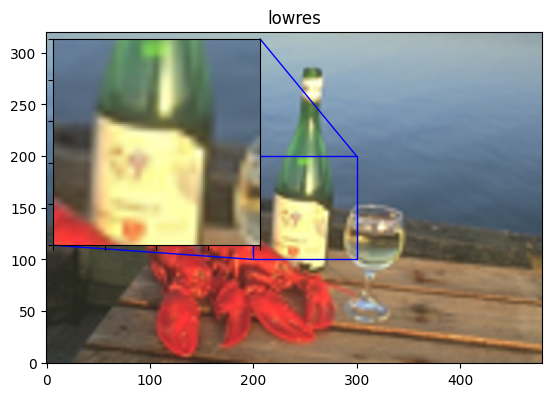

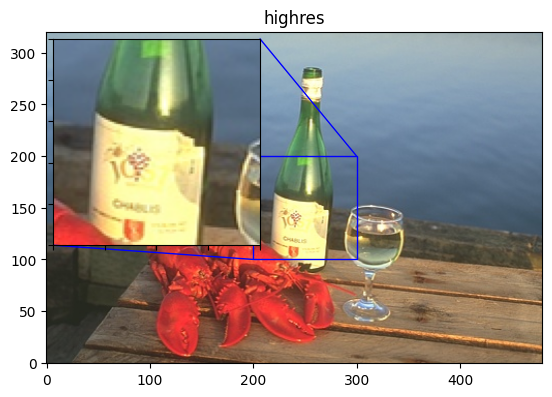

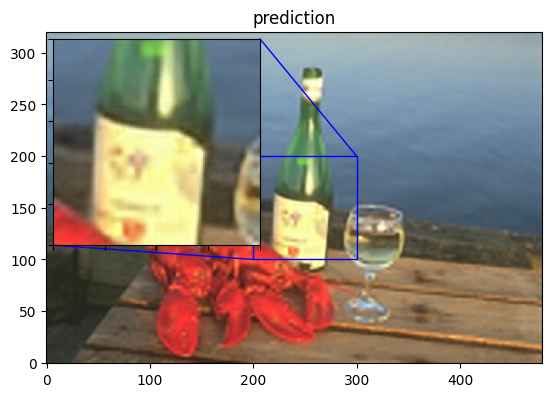

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
PSNR of low resolution image and high resolution image is 25.1103
PSNR of predict and high resolution is 25.8315


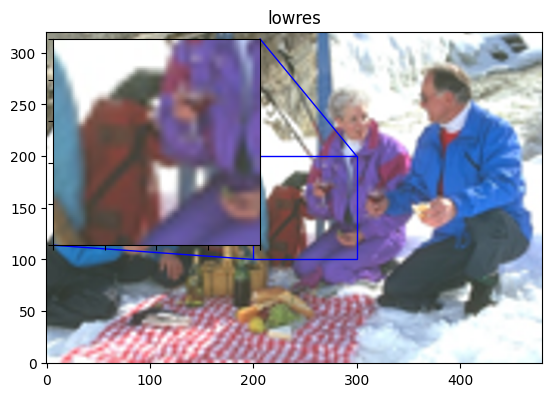

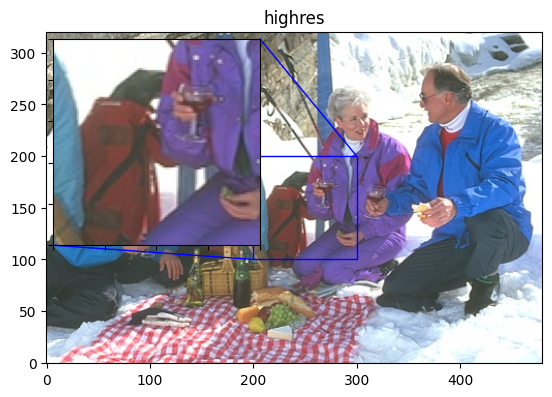

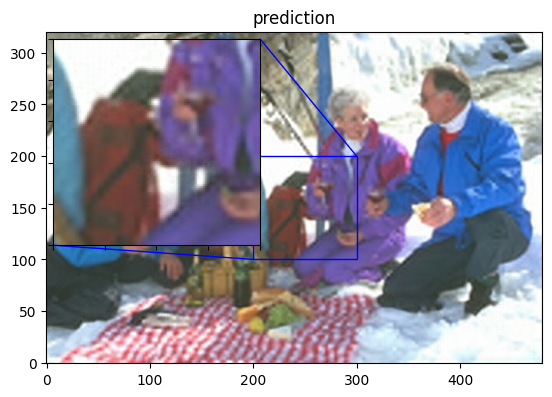

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 653ms/step
PSNR of low resolution image and high resolution image is 27.7789
PSNR of predict and high resolution is 28.1851


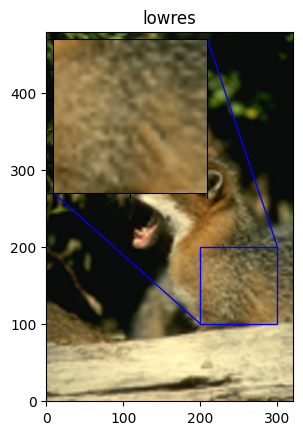

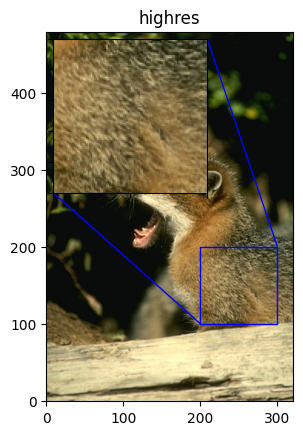

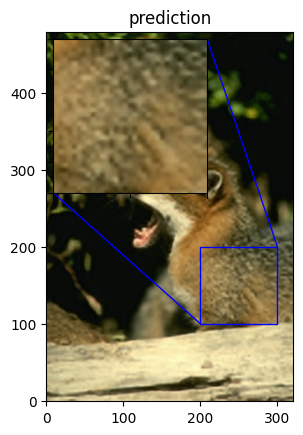

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
PSNR of low resolution image and high resolution image is 28.0321
PSNR of predict and high resolution is 28.2034


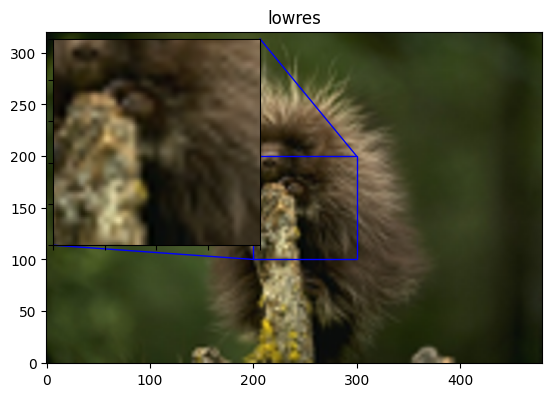

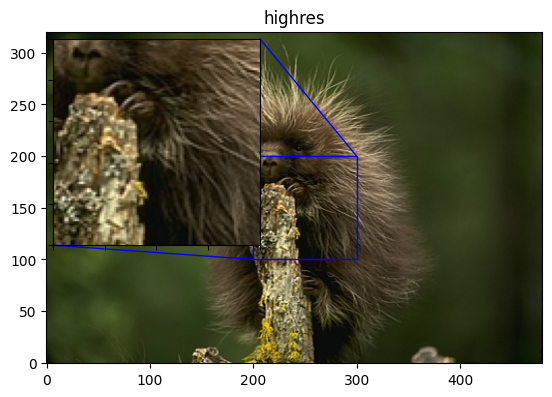

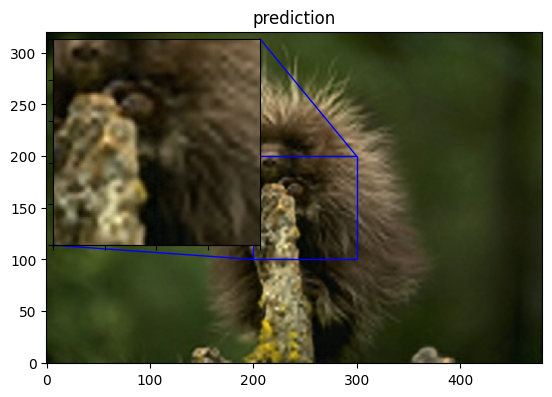

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
PSNR of low resolution image and high resolution image is 25.7853
PSNR of predict and high resolution is 26.2087


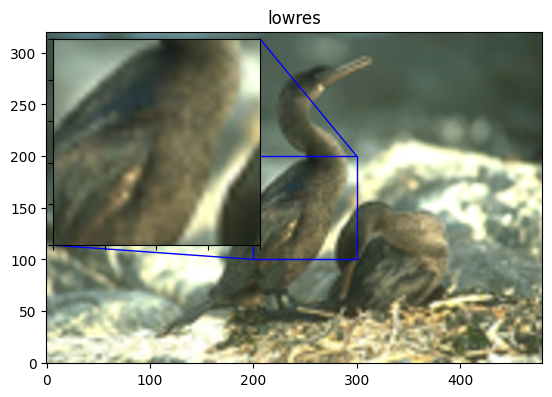

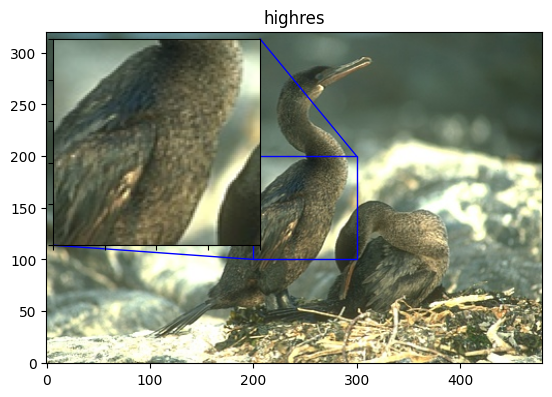

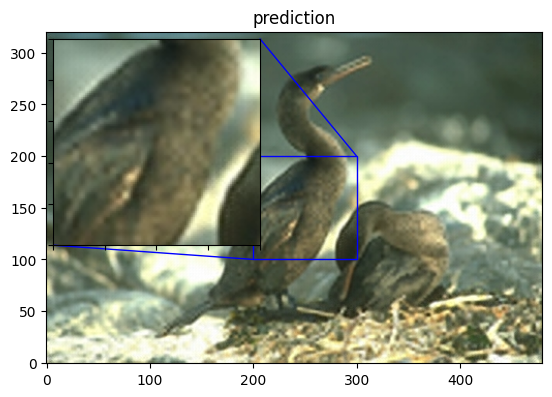

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
PSNR of low resolution image and high resolution image is 25.9181
PSNR of predict and high resolution is 26.4927


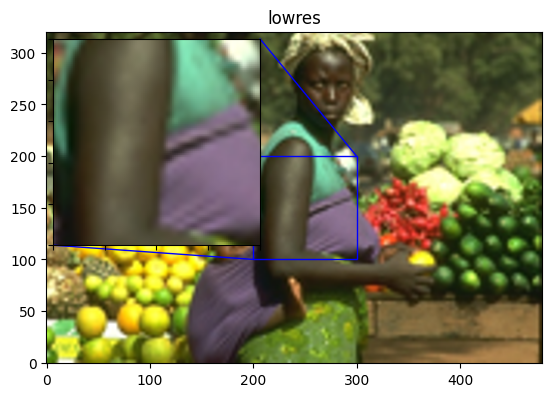

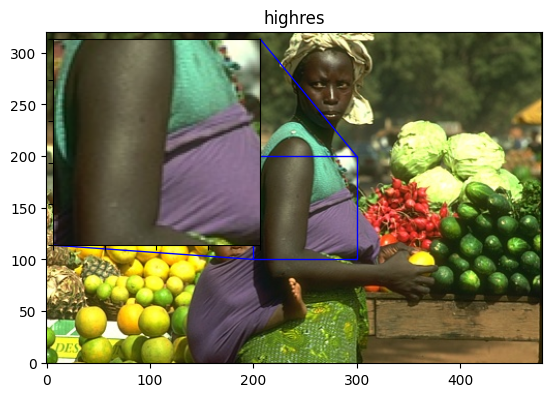

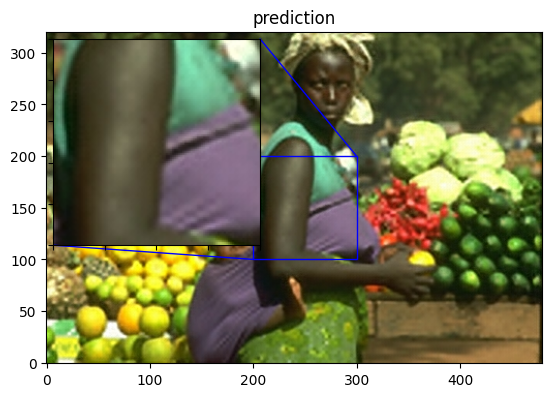

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
PSNR of low resolution image and high resolution image is 26.2389
PSNR of predict and high resolution is 26.9478


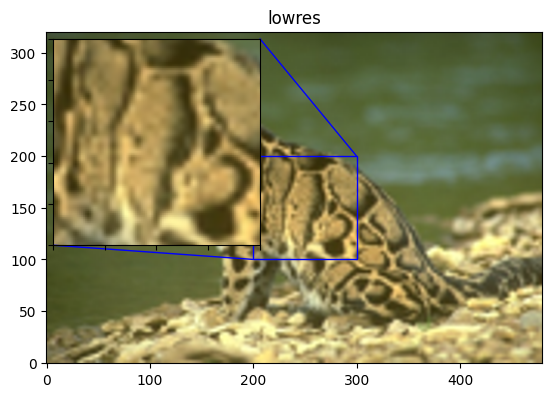

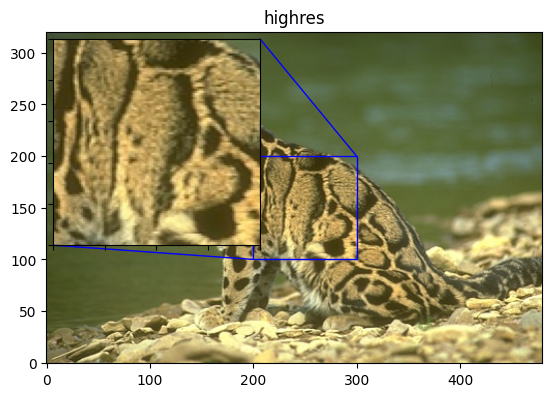

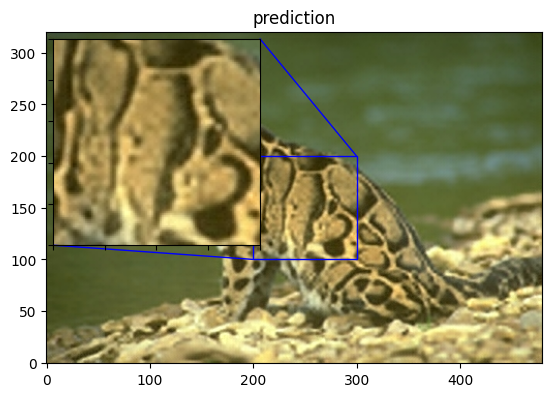

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
PSNR of low resolution image and high resolution image is 23.3281
PSNR of predict and high resolution is 24.2641


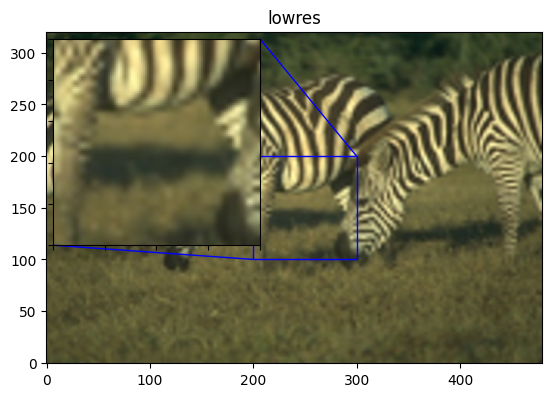

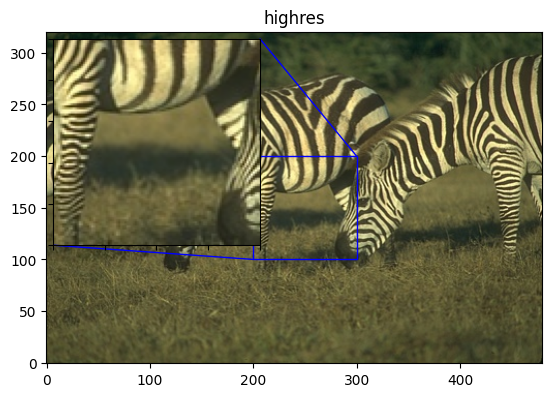

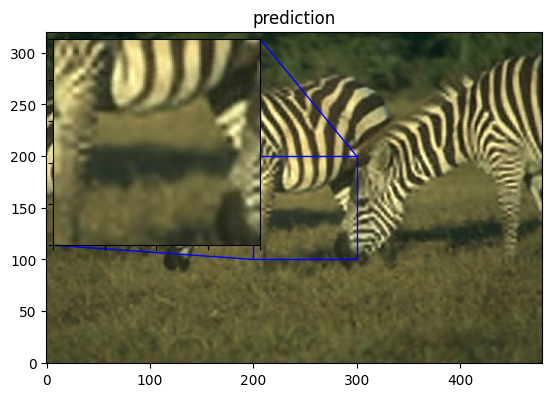

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
PSNR of low resolution image and high resolution image is 29.9008
PSNR of predict and high resolution is 29.9635


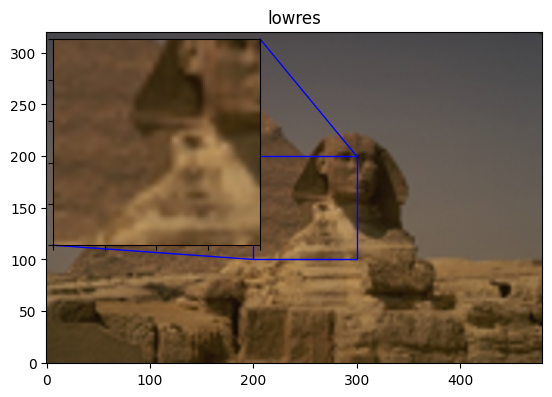

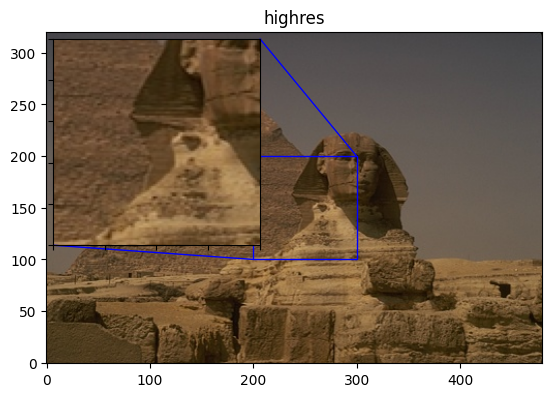

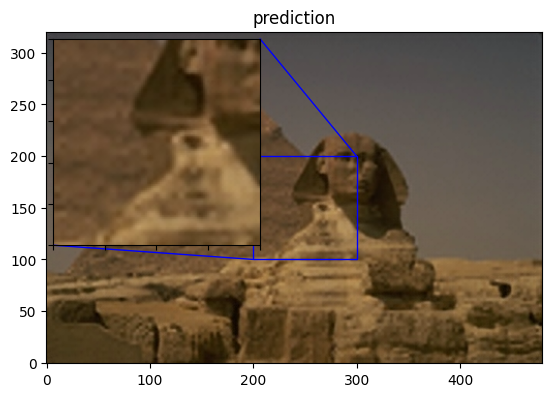

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
PSNR of low resolution image and high resolution image is 25.2492
PSNR of predict and high resolution is 25.6498


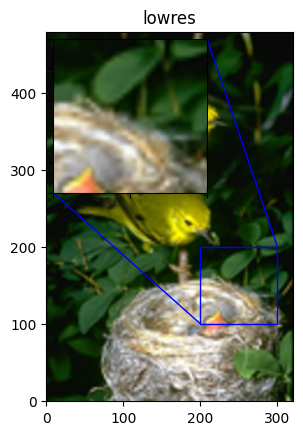

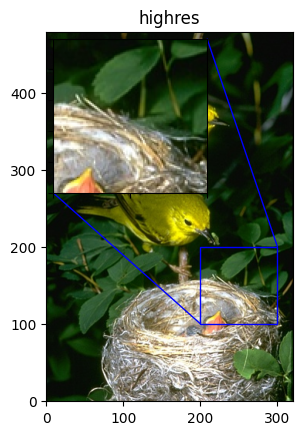

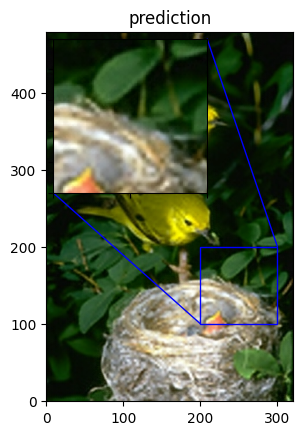

Avg. PSNR of lowres images is 26.7357
Avg. PSNR of reconstructions is 27.2055


In [ ]:
total_bicubic_psnr = 0.0
total_test_psnr = 0.0

for index, test_img_path in enumerate(test_img_paths[50:60]):
    img = load_img(test_img_path)
    lowres_input = get_lowres_image(img, upscale_factor)
    w = lowres_input.size[0] * upscale_factor
    h = lowres_input.size[1] * upscale_factor
    highres_img = img.resize((w, h))
    prediction = upscale_image(model, lowres_input)
    lowres_img = lowres_input.resize((w, h))
    lowres_img_arr = img_to_array(lowres_img)
    highres_img_arr = img_to_array(highres_img)
    predict_img_arr = img_to_array(prediction)
    bicubic_psnr = tf.image.psnr(lowres_img_arr, highres_img_arr, max_val=255)
    test_psnr = tf.image.psnr(predict_img_arr, highres_img_arr, max_val=255)

    total_bicubic_psnr += bicubic_psnr
    total_test_psnr += test_psnr

    print(
        "PSNR of low resolution image and high resolution image is %.4f" % bicubic_psnr
    )
    print("PSNR of predict and high resolution is %.4f" % test_psnr)
    plot_results(lowres_img, index, "lowres")
    plot_results(highres_img, index, "highres")
    plot_results(prediction, index, "prediction")

print("Avg. PSNR of lowres images is %.4f" % (total_bicubic_psnr / 10))
print("Avg. PSNR of reconstructions is %.4f" % (total_test_psnr / 10))

In [ ]:
!wget -q https://github.com/rajeevratan84/ModernComputerVision/raw/main/birdy.jpg

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 594ms/step
PSNR of low resolution image and high resolution image is 33.1353
PSNR of predict and high resolution is 32.9267


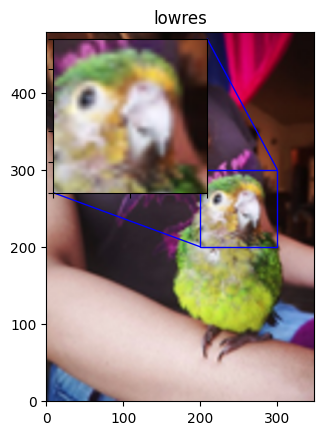

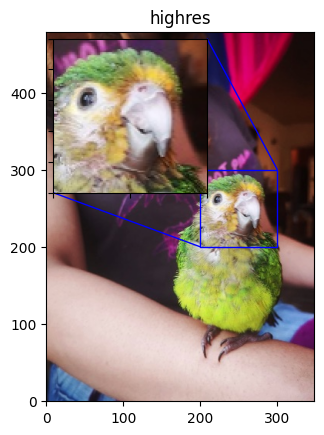

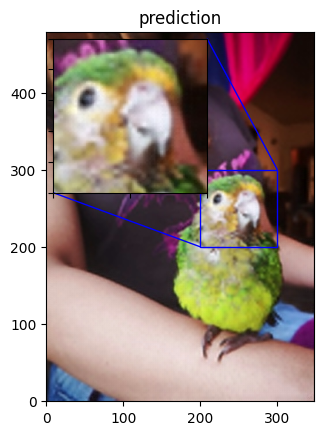

In [ ]:
# We define the ROI area of interest
def plot_results(img, prefix, title):
    """Plot the result with zoom-in area."""
    img_array = img_to_array(img)
    img_array = img_array.astype("float32") / 255.0

    # Create a new figure with a default 111 subplot.
    fig, ax = plt.subplots()
    im = ax.imshow(img_array[::-1], origin="lower")

    plt.title(title)
    # zoom-factor: 2.0, location: upper-left
    axins = zoomed_inset_axes(ax, 2, loc=2)
    axins.imshow(img_array[::-1], origin="lower")

    # Specify the limits.
    x1, x2, y1, y2 = 200, 300, 200, 300
    # Apply the x-limits.
    axins.set_xlim(x1, x2)
    # Apply the y-limits.
    axins.set_ylim(y1, y2)

    plt.yticks(visible=False)
    plt.xticks(visible=False)

    # Make the line.
    mark_inset(ax, axins, loc1=1, loc2=3, fc="none", ec="blue")
    plt.savefig(str(prefix) + "-" + title + ".png")
    plt.show()

def super_res_image(image_path):
    total_bicubic_psnr = 0.0
    total_test_psnr = 0.0
    img = load_img(image_path)
    lowres_input = get_lowres_image(img, upscale_factor)
    w = lowres_input.size[0] * upscale_factor
    h = lowres_input.size[1] * upscale_factor
    highres_img = img.resize((w, h))
    prediction = upscale_image(model, lowres_input)
    lowres_img = lowres_input.resize((w, h))
    lowres_img_arr = img_to_array(lowres_img)
    highres_img_arr = img_to_array(highres_img)
    predict_img_arr = img_to_array(prediction)
    bicubic_psnr = tf.image.psnr(lowres_img_arr, highres_img_arr, max_val=255)
    test_psnr = tf.image.psnr(predict_img_arr, highres_img_arr, max_val=255)

    total_bicubic_psnr += bicubic_psnr
    total_test_psnr += test_psnr

    print(f"PSNR of low resolution image and high resolution image is {bicubic_psnr:.4f}")
    print(f"PSNR of predict and high resolution is {test_psnr:.4f}")

    plot_results(lowres_img, index, "lowres")
    plot_results(highres_img, index, "highres")
    plot_results(prediction, index, "prediction")

super_res_image('birdy.jpg')